In [126]:
import numpy as np
from scipy.integrate import solve_ivp
from matplotlib import pyplot as plt
import IPython
import wavio
from scipy.interpolate import CubicSpline
from scipy.stats import linregress


def Lorentz(t,a):
    u = a[0] # unpack x
    v = a[1] # unpack y
    w = a[2] # unpack z
    dotu = 16*(v-u)
    dotv = u*(45.6-20*w)-v
    dotw = 5*u*v - 4*w
    return np.array([dotu,dotv,dotw]) # return vector of derivatives


## Create 'encoded' signal

616320
616320
44100


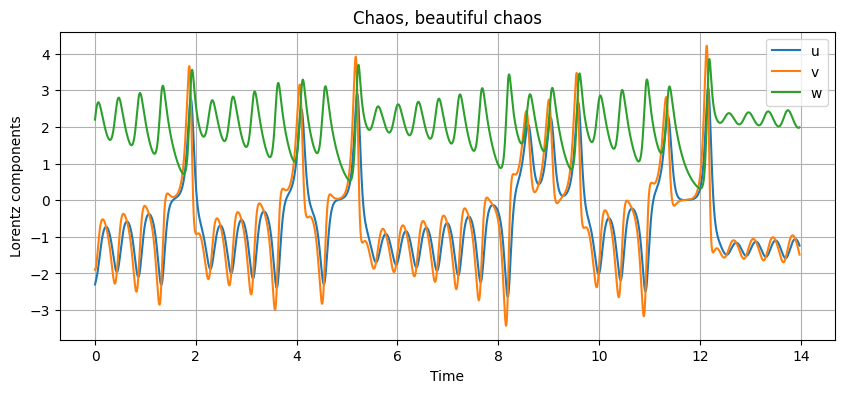

In [75]:
wav_obj = wavio.read('phone.wav')
audio_data = wav_obj.data
sample_rate = wav_obj.rate

ic = np.array([-2.3, -1.9, 2.2])  # Initial conditions
tend = len(audio_data) / sample_rate  # Calculate the duration of the audio file
t = np.linspace(0, tend, len(audio_data))  # Times for simulation
sol = solve_ivp(Lorentz, [0, tend], ic, t_eval=t, atol=1e-9, rtol=1e-8)

u = sol.y[0,:] # extract x(t)
v = sol.y[1,:] # extract y(t)
w = sol.y[2,:] # extract z(t)

print(len(audio_data))
print(len(u))
print(sample_rate)

fig,ax = plt.subplots(figsize=(10,4))
ax.plot(t,u,label="u")
ax.plot(t,v,label="v")
ax.plot(t,w,label="w")
ax.set_xlabel("Time")
ax.set_ylabel("Lorentz components")
ax.set_title("Chaos, beautiful chaos")
ax.legend()
ax.grid();

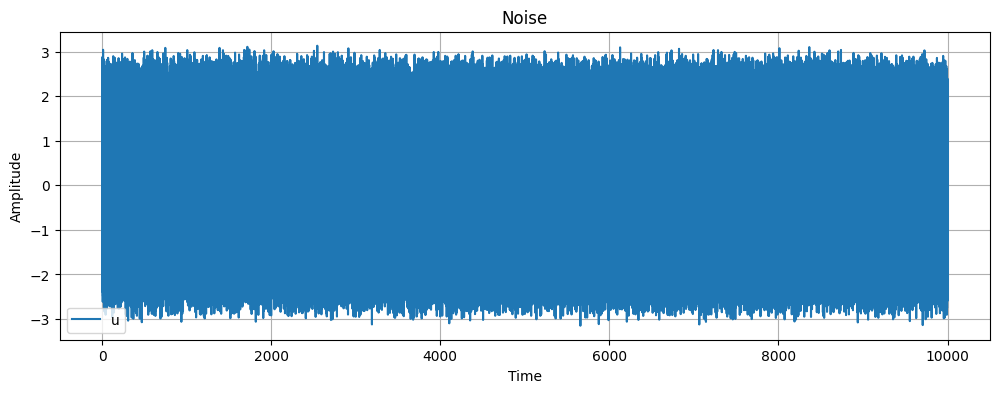

In [115]:
ic = np.array([-2.3, -1.9, 2.2])  # Initial conditions
tend = 10000 
t = np.linspace(0, tend, len(audio_data))  # Times for simulation
sol = solve_ivp(Lorentz, [0, tend], ic, t_eval=t, atol=1e-9, rtol=1e-8)

u = sol.y[0,:] # extract u(t)
fig,ax = plt.subplots(figsize=(12,4))
ax.plot(t,u,label="u")
ax.set_xlabel("Time")
ax.set_ylabel("Amplitude")
ax.set_title("Noise")
ax.legend()
ax.grid();

In [120]:
u *= 3
u1 = u - u.mean()
u1 = u1 / abs(u1).max()
wavio.write("noise.wav", u,sample_rate, sampwidth=2)
import IPython
IPython.display.Audio("noise.wav")

/Users/crinkosk/mambaforge/envs/mathproj/lib/python3.12/site-packages/wavio.py:259: ClippedDataWarning: Some data values have been clipped.  With scale=1.0, the interval of input values that will not be clipped is [-1.0000305180437934, 1.0]
  _warnings.warn(ClippedDataWarning(msg))


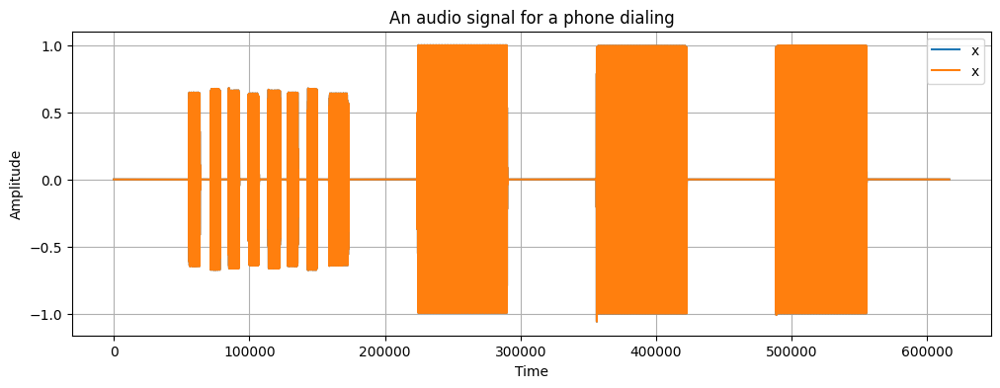

In [121]:

import IPython
k = wavio.read("phone.wav")
wavio.write("ch1.wav", k.data, 44100, sampwidth=2)
fig,ax = plt.subplots(figsize=(12,4))
ax.plot(np.arange(len(k.data)),k.data/np.abs(k.data.max()),label="x")
ax.set_xlabel("Time")
ax.set_ylabel("Amplitude")
ax.set_title("An audio signal for a phone dialing")
ax.legend()
ax.grid();

In [122]:
IPython.display.Audio("ch1.wav")

In [123]:
# now we add the noise to the piano music
noisesize = np.sqrt((u**2).sum())
musicsize = np.sqrt((k.data[:]**2).sum())
signal = u + k.data[:,0]/np.abs(k.data.max())
signal1 = signal-signal.mean()
signal1 = signal1 / np.abs(signal1).max()
wavio.write("signal.wav",signal,44100,sampwidth=2)
IPython.display.Audio("signal.wav")

/var/folders/ct/g0bw_2tn6c334f30kpvj24jm0000gn/T/ipykernel_2694/1153116917.py:3: RuntimeWarning: invalid value encountered in sqrt
  musicsize = np.sqrt((k.data[:]**2).sum())


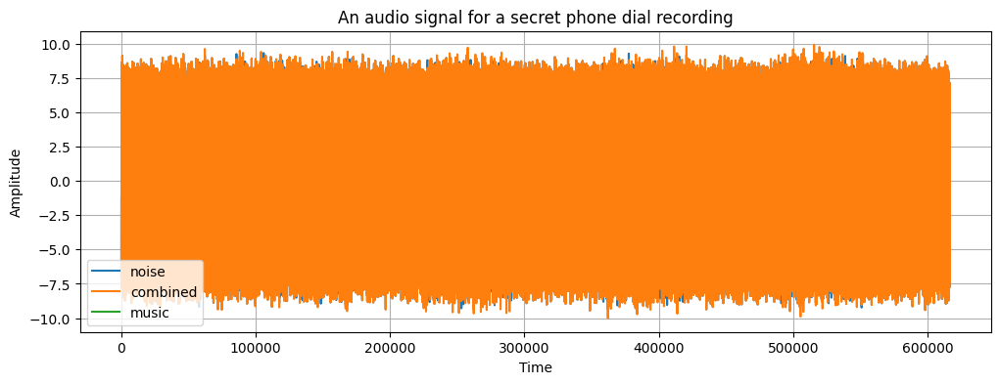

In [125]:
fig,ax = plt.subplots(figsize=(12,4))
ax.plot(np.arange(len(k.data)),u,label="noise")
ax.plot(np.arange(len(k.data)),signal,label="combined")
ax.plot(np.arange(len(k.data)),k.data[:,0]/musicsize/noisesize,label="music")
ax.set_xlabel("Time")
ax.set_ylabel("Amplitude")
ax.set_title("An audio signal for a secret phone dial recording")
ax.legend()
ax.grid();

## Recover the message

In [127]:
ufun = CubicSpline(t,signal)
ufun(np.array([2.3]))[0]

-5.594975570742352

In [128]:
def Lorentz2(tt,a):
    assert np.isscalar(tt)
    U = a[0]
    V = a[1]
    W = a[2]
    uu = ufun(np.array([tt]))[0]
    dotU = 16*(V-U)
    dotV = uu*(45.6-20*W)-V
    dotW = 5*uu*V - 4*W
    return np.array([dotU,dotV,dotW])

tend = 10000 # simulation end time
sol = solve_ivp(Lorentz2,[0,tend],ic,t_eval=t,atol=1e-9,rtol=1e-8) # :) :) :)
assert sol.success
U = sol.y[0,:] # extract U(t)

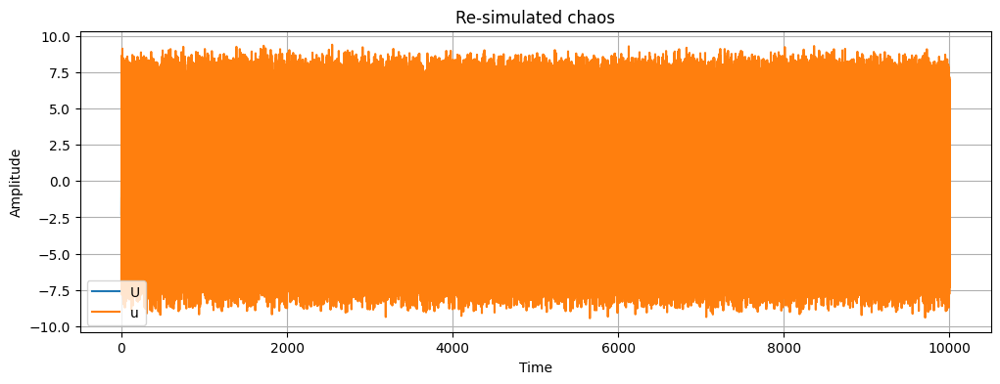

In [129]:
fig,ax = plt.subplots(figsize=(12,4))
ax.plot(t,U,label="U")
ax.plot(t,u,label="u")
ax.set_xlabel("Time")
ax.set_ylabel("Amplitude")
ax.set_title("Re-simulated chaos")
ax.legend()
ax.grid();

In [132]:
U *= 3
recoveredmusic = U - u
recoveredmusic1 = recoveredmusic-recoveredmusic.mean()
recoveredmusic1= recoveredmusic / abs(recoveredmusic).max()
wavio.write("recoveredmusic.wav",recoveredmusic,44100,sampwidth=2)
IPython.display.Audio("recoveredmusic.wav")

/Users/crinkosk/mambaforge/envs/mathproj/lib/python3.12/site-packages/wavio.py:259: ClippedDataWarning: Some data values have been clipped.  With scale=1.0, the interval of input values that will not be clipped is [-1.0000305180437934, 1.0]
  _warnings.warn(ClippedDataWarning(msg))


In [133]:

s_signal = signal + recoveredmusic


In [134]:
s_ufun = CubicSpline(t,s_signal)
s_ufun(np.array([2.3]))[0]

-2.3109338298504998

In [137]:

s_sol = solve_ivp(Lorentz2,[0,tend],ic,t_eval=t,atol=1e-9,rtol=1e-8) # :) :) :)
assert s_sol.success
s_U = s_sol.y[0,:] # extract U(t)



In [138]:
s_recoveredmusic = s_U - u
s_recoveredmusic1 = s_recoveredmusic-s_recoveredmusic.mean()
s_recoveredmusic1= s_recoveredmusic / abs(s_recoveredmusic).max()
wavio.write("s_recoveredmusic.wav",s_recoveredmusic1,44100,sampwidth=2)
IPython.display.Audio("s_recoveredmusic.wav")